# Using Fine Grained Classification using Transfer Learning

In this example, I will demonstrate the details involved in training a Neural Network to distinguish between 37 different classes of images.

In [2]:
#This allows us to store the plots in the output
%matplotlib inline

Import the [fastai V1](http://www.fast.ai/2018/10/02/fastai-ai/) library which sits on top of [Pytorch 1.0](https://hackernoon.com/pytorch-1-0-468332ba5163). 

In [3]:
#from fastai import *
from fastai.vision import *
from fastai.metrics import error_rate

## About the data

We are going to use the [Oxford-IIIT Pet Dataset](http://www.robots.ox.ac.uk/~vgg/data/pets/) by [O. M. Parkhi et al., 2012](http://www.robots.ox.ac.uk/~vgg/publications/2012/parkhi12a/parkhi12a.pdf) which features 12 cat breeds and 25 dogs breeds. 

Our model will learn to differentiate between these 37 distinct categories. According to their paper, the best accuracy they could get in 2012 was 59.21%, using a complex model that was specific to pet detection, with separate "Image", "Head", and "Body" models for the pet photos.

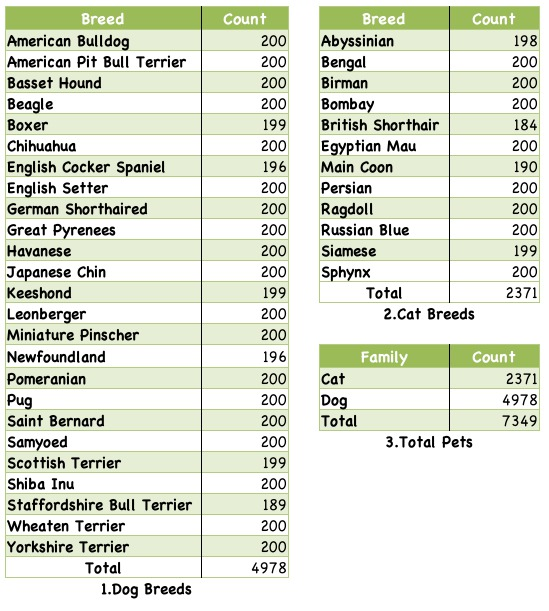

First we download the data (almost 800MB) and setup the path variables. 

In [4]:
path = untar_data('https://s3.amazonaws.com/fast-ai-imageclas/oxford-iiit-pet'); 
path

PosixPath('/home/abdqeb/.fastai/data/oxford-iiit-pet')

In [5]:
path.ls()

[PosixPath('/home/abdqeb/.fastai/data/oxford-iiit-pet/annotations'),
 PosixPath('/home/abdqeb/.fastai/data/oxford-iiit-pet/images')]

In [6]:
images_path = path/'images'

Looking at the images, in the folder we can see that the labels are part of the image names.

In [7]:
imagefilenames = get_image_files(images_path)
imagefilenames[:5]

[PosixPath('/home/abdqeb/.fastai/data/oxford-iiit-pet/images/japanese_chin_6.jpg'),
 PosixPath('/home/abdqeb/.fastai/data/oxford-iiit-pet/images/saint_bernard_13.jpg'),
 PosixPath('/home/abdqeb/.fastai/data/oxford-iiit-pet/images/great_pyrenees_175.jpg'),
 PosixPath('/home/abdqeb/.fastai/data/oxford-iiit-pet/images/yorkshire_terrier_11.jpg'),
 PosixPath('/home/abdqeb/.fastai/data/oxford-iiit-pet/images/Egyptian_Mau_94.jpg')]

## Creating the data bunch

Then we extract the labels from the filenames.

`ImageDataBunch.from_name_re` gets the labels from the filenames using a [regular expression](https://docs.python.org/3.6/library/re.html).

Note: Image size 224 is a recommended image size. According to the documentation, images of multiple sizes of 7 work best.

In [8]:
np.random.seed(2) #By setting the seed, we guarantee the validation set will be the same every time
regex_pattern = r'/([^/]+)_\d+.jpg$'
batchsize = 64 #half or quarter this number if you run our of memory on the GPU
data = ImageDataBunch.from_name_re(
    images_path, #the local path to our images.
    imagefilenames, #the filenames of all images.
    regex_pattern, #pattern for extracting the class names from the filename.
    valid_pct=0.2, #this determines the size of our validation set
    ds_tfms=get_transforms(), #Accept default image transformations (crop and center)
    size=224, #This is the image size
    bs=batchsize #how many images to train at once.
)

In [9]:
print(data.classes)

['Abyssinian', 'Bengal', 'Birman', 'Bombay', 'British_Shorthair', 'Egyptian_Mau', 'Maine_Coon', 'Persian', 'Ragdoll', 'Russian_Blue', 'Siamese', 'Sphynx', 'american_bulldog', 'american_pit_bull_terrier', 'basset_hound', 'beagle', 'boxer', 'chihuahua', 'english_cocker_spaniel', 'english_setter', 'german_shorthaired', 'great_pyrenees', 'havanese', 'japanese_chin', 'keeshond', 'leonberger', 'miniature_pinscher', 'newfoundland', 'pomeranian', 'pug', 'saint_bernard', 'samoyed', 'scottish_terrier', 'shiba_inu', 'staffordshire_bull_terrier', 'wheaten_terrier', 'yorkshire_terrier']


In [10]:
len(data.classes)

37

In [11]:
data.c

37

Then, we normalize the RGB colors so that they have a mean of ZERO and Standard Deviation of 1.

In [12]:
data.normalize(imagenet_stats)

ImageDataBunch;

Train: LabelList (5912 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
japanese_chin,saint_bernard,great_pyrenees,japanese_chin,wheaten_terrier
Path: /home/abdqeb/.fastai/data/oxford-iiit-pet/images;

Valid: LabelList (1478 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
chihuahua,Ragdoll,japanese_chin,Birman,american_pit_bull_terrier
Path: /home/abdqeb/.fastai/data/oxford-iiit-pet/images;

Test: None

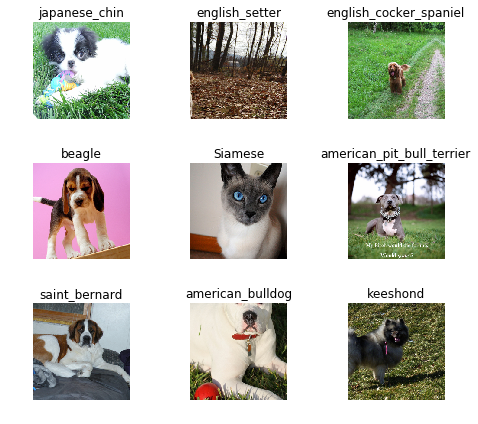

In [13]:
data.show_batch(rows=3, figsize=(7,6))

## Using Transfer Learning to Train: resnet50

We will use a [convolutional neural network](http://cs231n.github.io/convolutional-networks/) backbone and a fully connected head with a single hidden layer as a classifier.

PyTorch includes pre-trained models

[resnet34](https://www.kaggle.com/pytorch/resnet34) Training Model - Pretrained Data - Faster for testing

[resnet50](https://www.kaggle.com/pytorch/resnet50) Training Model - Pretrained Data - Slower, use for best results!

Note: Think of these as an excelent set of predefined weights for the Neural Net. Training ontop of these weights has proven to provide siginificant training advantage.

If you are wondering why we should use the resnet50 model, please see the [standford benchamrks for image traning models](https://dawn.cs.stanford.edu/benchmark/#imagenet-train-time)

In [15]:
#Create a learn object that will store our learning epochs
#models.resnet34 will use the generically trained resent34 neural network
#pretrained:bool=True This will download a set of pretrained weights based on the selected model
learn = cnn_learner(data, models.resnet50, pretrained=True, metrics=[error_rate,accuracy])

#when doing proof of concept, train using resnet34, it is very good and much faster.
#learn = cnn_learner(data, models.resnet34, pretrained=True, metrics=error_rate)

This is the concept of **Transfer Learning**. By starting from a pretrained neural network, we take a model that knows how to do something very well, and make it do our thing (classifying breeds of cats and dogs) very well!

This method of transfer learning allows improved speeds of 1/100th time of training and also 1/100th reduction in dataset size!

In [16]:
#Run learn.model to see some details about the model
#learn.model

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


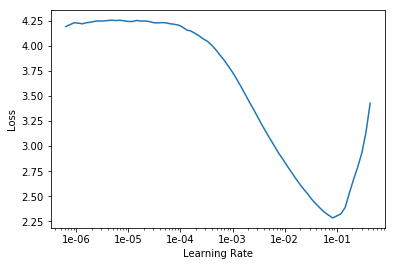

In [17]:
learn.lr_find()
learn.recorder.plot()

**NOTE:** I will be using fit_one_cycle instead of fit. This is due to a recent (2018) research paper that discovered a much faster way to do the fit cycle.

[What is fit one cycle](https://docs.fast.ai/callbacks.one_cycle.html#What-is-1cycle?)


[fit_one_cycle Research Paper](https://arxiv.org/pdf/1803.09820.pdf)


[fit_one_cycle Graphical Explanation](https://sgugger.github.io/the-1cycle-policy.html) 

In [18]:
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.856051,0.284543,0.093369,0.906631,01:53
1,0.401538,0.253705,0.086604,0.913396,01:45
2,0.245220,0.205759,0.066306,0.933694,01:45
3,0.174595,0.202925,0.062923,0.937077,01:44


Epoch: A complete training itiration using the full image set

We want our Train_Loss to be LESS than our valid_loss 

Error_Rate: We use a validation set to make sure we are not over fitting. The validation set is a set of images that the model does not get to look at. Error_Rate is calcualted based on testing the validation set. 

In [19]:
#This is going to put the model in a subdirectory where the data came from
learn.save('stage-1')

At this point, we have completed training our model and we can start using it


## Testing our trained Model

We create an interpreter using the learner, which at this point contains the data and the trained model

In [20]:
interpreter = ClassificationInterpretation.from_learner(learn)

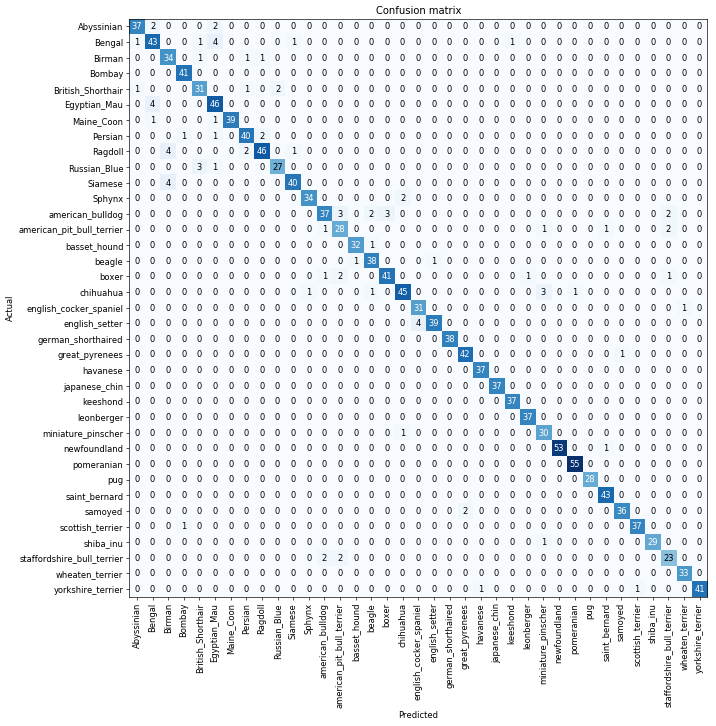

In [21]:
interpreter.plot_confusion_matrix(figsize=(12,12), dpi=60)

The confusion matrix shows that our classifier has trouble with:
- Ragdoll and Birman
- Egyptian_Mau and Bengal

Otherwise, it is doing a pretty good job!

Above, I looked at the matrix to figure out the highest errors. 

This will give us a printed list of the most confused. I found this function very useful along with the matrix.

In [22]:
interpreter.most_confused(min_val=3)

[('Bengal', 'Egyptian_Mau', 4),
 ('Egyptian_Mau', 'Bengal', 4),
 ('Ragdoll', 'Birman', 4),
 ('Siamese', 'Birman', 4),
 ('english_setter', 'english_cocker_spaniel', 4),
 ('Russian_Blue', 'British_Shorthair', 3),
 ('american_bulldog', 'american_pit_bull_terrier', 3),
 ('american_bulldog', 'boxer', 3),
 ('chihuahua', 'miniature_pinscher', 3)]

The best feature of all, is the ability to see the images that failed the test. Looking at these we can gather an idea of why it failed to correctly classify them.

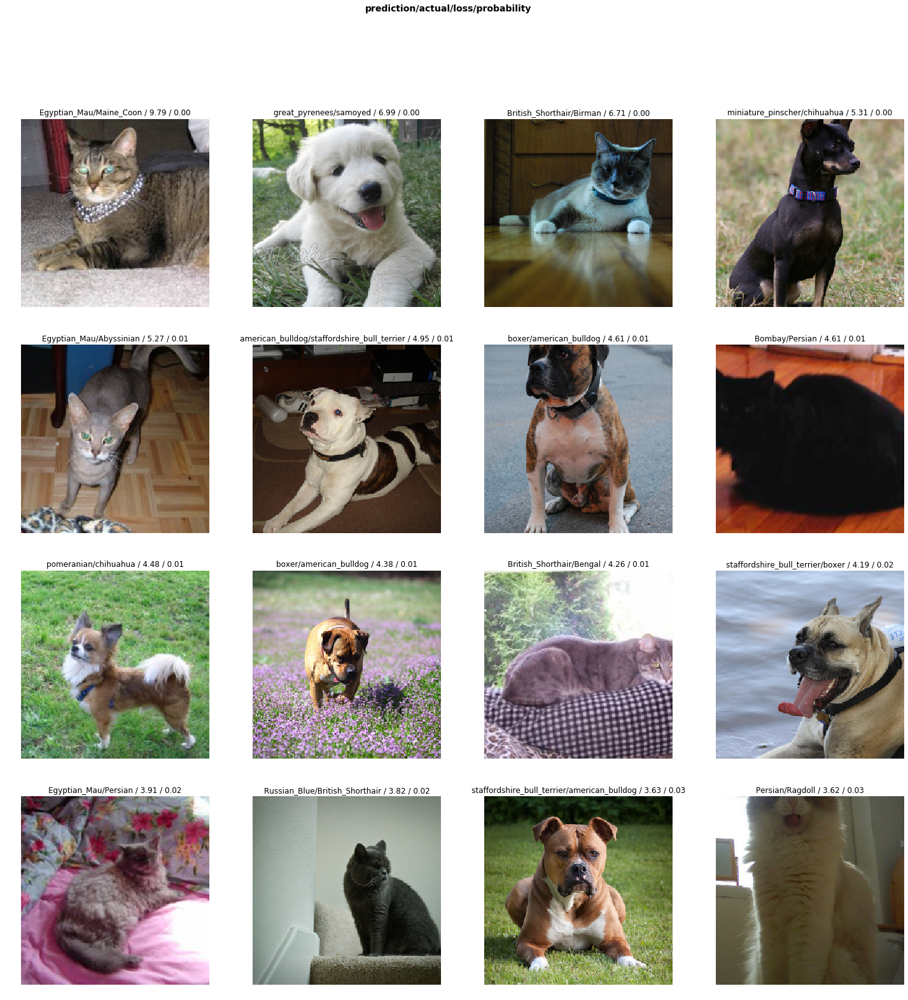

In [23]:
#doc(interpreter.plot_top_losses)
interpreter.plot_top_losses(16, figsize=(25,25), heatmap=False)

Here are the images again with heatmap turned ON. The heat map tells us which part of the image the model was using to make its classification! This is also very useful

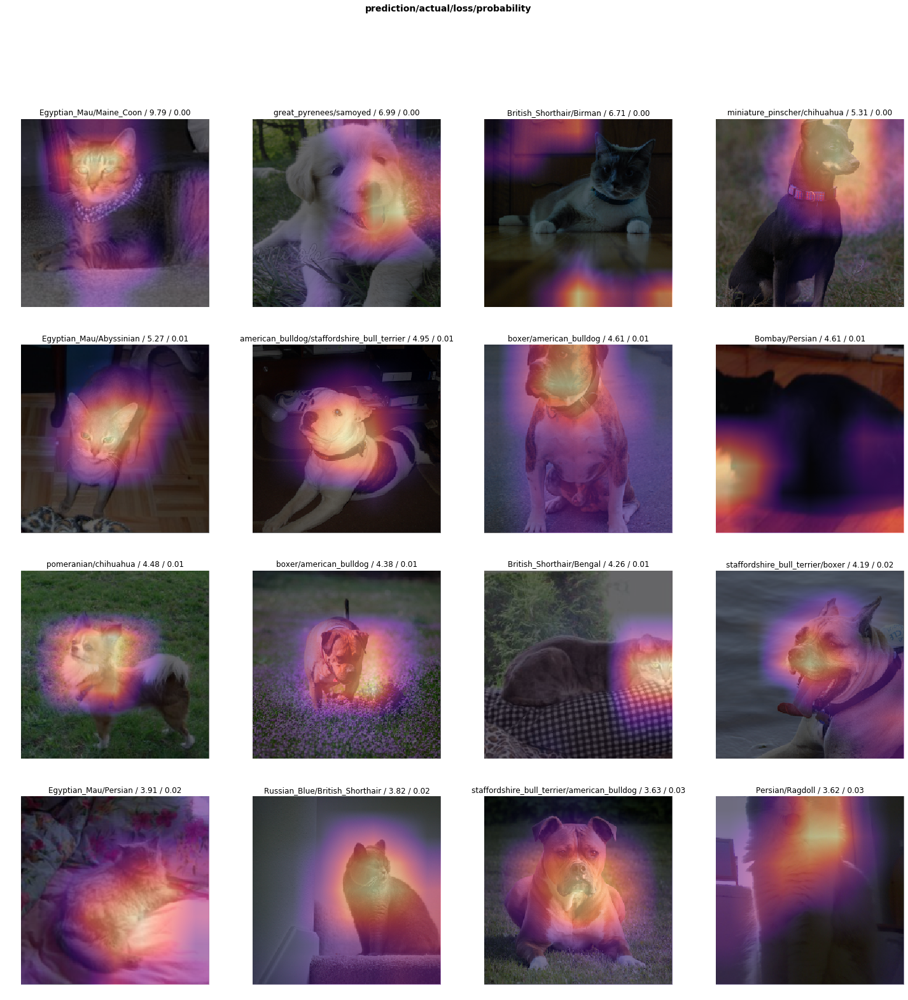

In [24]:
interpreter.plot_top_losses(16, figsize=(25,25), heatmap=True)

## Visualizing and Understanding Concolutional Networks 

[Matthew D Zeiler, Rob Fergus](https://arxiv.org/abs/1311.2901)

(Submitted on 12 Nov 2013 (v1), last revised 28 Nov 2013 (this version, v3))

In Layer one, simple lines and gradients are understood by the Neural Net

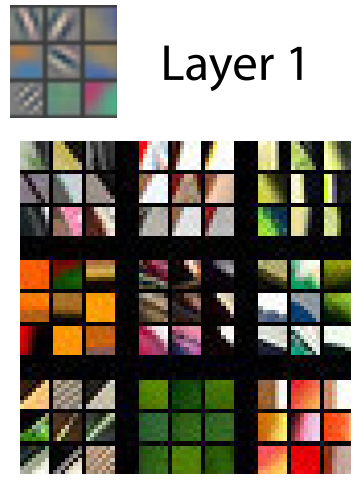

In Layer 2: understands corners, curves, circles, simple patterns

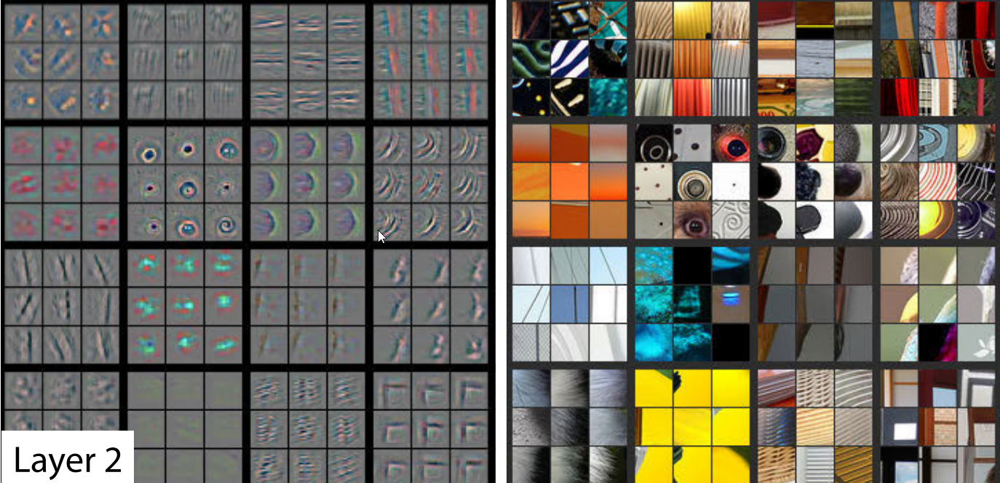

Layer 3: can find repeating patterns of objects, like text, faces, wheels, ...etc

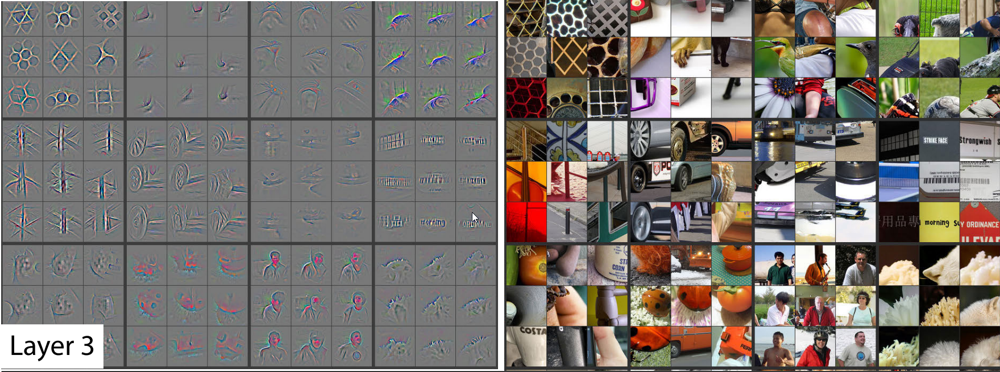

As we go deeper and deeper, the pre-trained neural net can recognice more and more generic shapes and groups. The net already knows the difference between a dog an a cat, and has a built in conception of many different types of dogs and cats, but since it was not trained specifically on how to distinguish between them, initially it can not.

Our training builds ontop of this knowledge. What we do, is we replace the deepest layers with our trained layers.

Bt default, training affects all layers. Knowing what we know about this neural net, it would be of little benefit to retrain the top level layers since they are already very good at what they do. In order to leverate transfer learning we will be applying a scaled back propagation weighting system that will focus more on the deepest layers and less and less as it moves up to the top most layers. 

## Unfreezing, fine-tuning, and learning rates

Now, with my deeper understanding of pre-trained CNNs, I will try to fine tune this training to get even better results.

In [26]:
#This sets every layer group to trainable
learn.unfreeze()

In [25]:
#First I will demonstrate how training all layers is make our model worse and increase the error_rate
learn.fit_one_cycle(1)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.197784,0.361243,0.089986,0.910014,01:45


Our error_rate was 0.062923, after training all layers, it is now 0.097429.

That is about 4% increase in errors! In a resnet34 example, the error rate could increase by 8-10%

Let us roll back this training session

In [29]:
learn.load('stage-1');

To learn more about how this data set affects this model, we use the following functions to plot the learning rate graph.

### What we are looking for is the longest downward slope that is sticking around for a while. The general rule is to find the lowest point and then go back by about 10 points.

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


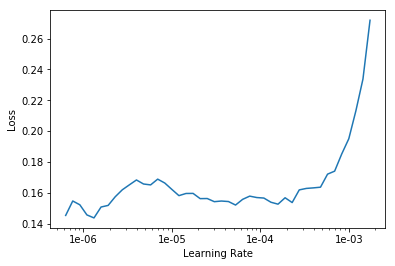

In [30]:
learn.lr_find()
learn.recorder.plot()

Notice how at the very end the line shoots up? This is basically telling us that our loss will increase if we train at learning rates greater than 1e-4. By default, the learning rate is 0.003. Which is too much for our data.


Note about reading e to the negative numbers: 
> 1e-4 = 0.0001

> 1e-3 = 0.001

In [31]:
learn.unfreeze()
learn.fit_one_cycle(4, max_lr=slice(1e-6,3e-3))

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.221716,0.278294,0.096076,0.903924,02:18
1,0.268148,0.252891,0.079838,0.920162,02:18
2,0.155342,0.195661,0.057510,0.942490,02:18
3,0.080912,0.171456,0.050068,0.949932,02:18


In [32]:
learn.save('stage-2')

In [33]:
learn.fit_one_cycle(4, max_lr=slice(1e-6,1e-3))

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.068692,0.216382,0.062246,0.937754,02:19
1,0.065228,0.199069,0.060893,0.939107,02:18
2,0.051335,0.188833,0.057510,0.942490,02:18
3,0.032217,0.187613,0.058863,0.941137,02:18


As you can see, further training yielded worse results. This continues on

In [ ]:
#Undo the latest learning results
#learn.load('stage-2');

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


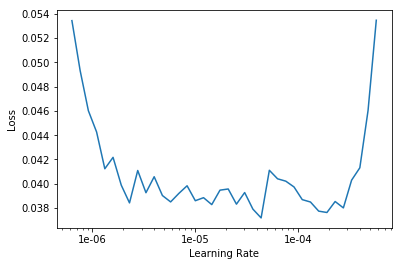

In [34]:
learn.lr_find()
learn.recorder.plot()

In [35]:
learn.fit_one_cycle(8, max_lr=slice(1e-6,3e-5))

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.031999,0.188655,0.056834,0.943166,02:18
1,0.031597,0.181324,0.054127,0.945873,02:18
2,0.035509,0.181844,0.056157,0.943843,02:18
3,0.025308,0.177507,0.054127,0.945873,02:18
4,0.025856,0.177120,0.052097,0.947903,02:18
5,0.022949,0.178226,0.051421,0.948579,02:18
6,0.023019,0.177417,0.051421,0.948579,02:18
7,0.021889,0.178319,0.048714,0.951286,02:18


In [36]:
#learn.load('stage-2');
learn.save('stage-3')

In [37]:
interpreter = ClassificationInterpretation.from_learner(learn)

In [38]:
interpreter.most_confused(min_val=3)

[('Ragdoll', 'Birman', 7),
 ('Egyptian_Mau', 'Bengal', 5),
 ('american_pit_bull_terrier', 'staffordshire_bull_terrier', 4),
 ('Bengal', 'Egyptian_Mau', 3),
 ('Siamese', 'Birman', 3),
 ('american_bulldog', 'boxer', 3),
 ('american_bulldog', 'staffordshire_bull_terrier', 3),
 ('chihuahua', 'miniature_pinscher', 3)]

I am very happy with these results!

# Exporting Our Model for Production

This will create a file named 'export.pkl' in the directory where we were working that contains everything we need to deploy our model (the model, the weights but also some metadata like the classes or the transforms/normalization used).

In [41]:
#this will give you the path of your working directory
source = learn.path

PosixPath('/home/abdqeb/.fastai/data/oxford-iiit-pet/images')

In [42]:
#this will create the trained model file that can be used in our API 
learn.export()
source = source/'export.pkl'

In [43]:
source

PosixPath('/home/abdqeb/.fastai/data/oxford-iiit-pet/images/export.pkl')

Now copy the file into our McMaster directory and reaname to 'breedsofcatsanddogs.pkl'

In [45]:
from shutil import copyfile
copyfile(source, '/data/home/abdqeb/notebooks/McMaster/breedsofcatsanddogs.pkl')

'/data/home/abdqeb/notebooks/McMaster/breedsofcatsanddogs.pkl'

Then download and replace the file into onedrive/Public folder